In [158]:
import pandas as pd
import numpy as np
import tslearn
import matplotlib.pyplot as plt
from statistics import mean
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.cluster import SpectralClustering
import seaborn as sns
from tslearn.clustering import TimeSeriesKMeans, KernelKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler
from pylab import rcParams
import pickle
rcParams['figure.figsize'] = 10, 5

In [2]:
data = pd.read_csv("1993.csv", names=["StationId", "Date", "Variable", "value", "MFlag", "QFlag", "SFlag", "ObsTime"])
print("Number of samples :", len(data))

Number of samples : 33974337


In [4]:
data.head()

,StationId,Date,Variable,value,MFlag,QFlag,SFlag,ObsTime
0,AE000041196,19930101,TMAX,223,NaN,NaN,I,NaN
1,AE000041196,19930101,TAVG,181,H,NaN,S,NaN
2,AEM00041217,19930101,TMAX,229,NaN,NaN,S,NaN
3,AEM00041217,19930101,TAVG,200,H,NaN,S,NaN
4,AEM00041194,19930101,TMAX,224,NaN,NaN,S,NaN


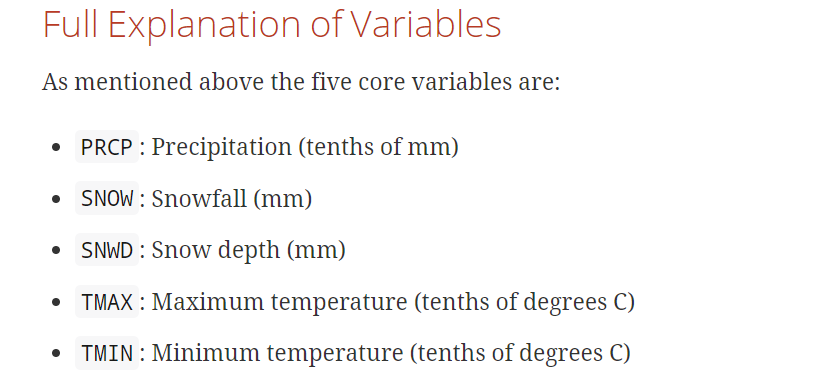

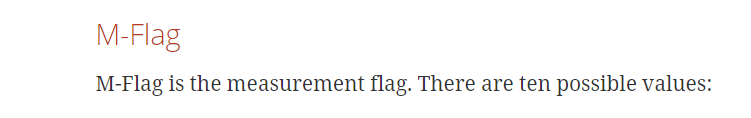

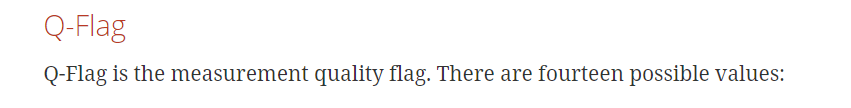

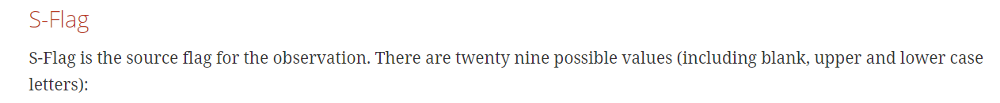

remove all the defective data and devide it by catgories 

In [182]:
data = data[data.QFlag.isnull()]
print("Number of samples after cleaning outliers", len(data))
data['Date'] = pd.to_datetime(data['Date'], format='%Y%m%d')
dataPRCP = data[data["Variable"] == "PRCP"][["StationId","Date", "value"]]
print("Number of PRCP samples", len(dataPRCP))
dataSnow = data[data["Variable"] == "SNOW"][["StationId","Date", "value"]]
print("Number of Snow samples", len(dataSnow))
dataSDepth = data[data["Variable"] == "SNWD"][["StationId","Date", "value"]]
print("Number of Snow depth samples", len(dataSDepth))
dataTmax = data[data["Variable"] == "TMAX"][["StationId","Date", "value"]]
print("Number of max Tempture samples", len(dataTmax))
dataTmin = data[data["Variable"] == "TMIN"][["StationId","Date", "value"]]
print("Number of min Tempture samples", len(dataTmin))

Number of samples after cleaning outliers 33793705
Number of PRCP samples 10156738
Number of Snow samples 3521530
Number of Snow depth samples 3940650
Number of max Tempture samples 5459238
Number of min Tempture samples 5362129


Now we'll check the corraltion of each variable with PRCP value

In [198]:
dfcorr = pd.merge(dataPRCP, dataSnow,  how='inner', left_on=["StationId","Date"], right_on = ["StationId","Date"], suffixes=('_PRCP', '_SNOW'))
print("PRCP and Snow corrlation \n", dfcorr.corr(method ='pearson'))
dfcorr = pd.merge(dataPRCP, dataSDepth,  how='inner', left_on=["StationId","Date"], right_on = ["StationId","Date"], suffixes=('_PRCP','_SNWD'))
print("PRCP and SNWD corrlation \n", dfcorr.corr(method ='pearson'))
dfcorr = pd.merge(dataPRCP, dataTmax,  how='inner', left_on=["StationId","Date"], right_on = ["StationId","Date"], suffixes=('_PRCP','_TMAX'))
print("PRCP and SNWD corrlation \n", dfcorr.corr(method ='pearson'))
dfcorr = pd.merge(dataPRCP, dataTmin,  how='inner', left_on=["StationId","Date"], right_on = ["StationId","Date"], suffixes=('_PRCP','_TMIN'))
print("PRCP and Tmin corrlation \n", dfcorr.corr(method ='pearson'))

PRCP and Snow corrlation 
             value_PRCP  value_SNOW
value_PRCP    1.000000    0.164847
value_SNOW    0.164847    1.000000
PRCP and SNWD corrlation 
             value_PRCP  value_SNWD
value_PRCP    1.000000   -0.005885
value_SNWD   -0.005885    1.000000
PRCP and SNWD corrlation 
             value_PRCP  value_TMAX
value_PRCP    1.000000    0.024856
value_TMAX    0.024856    1.000000
PRCP and Tmin corrlation 
             value_PRCP  value_TMIN
value_PRCP    1.000000    0.113133
value_TMIN    0.113133    1.000000


Plot all Distributions for checking if need normalization is needed

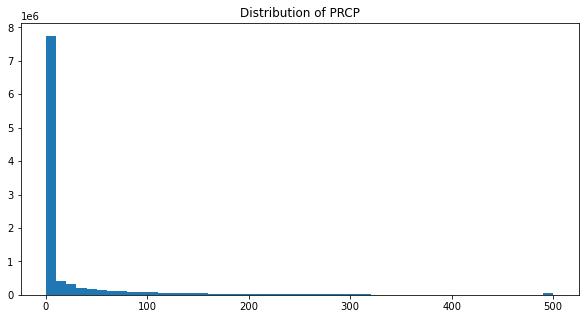

MAX = 5096, MIN = 0 AVG = 24.46667817954938


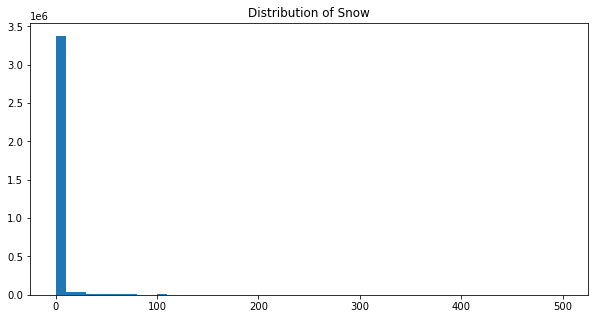

MAX = 1180, MIN = 0 AVG = 2.4590135537678224


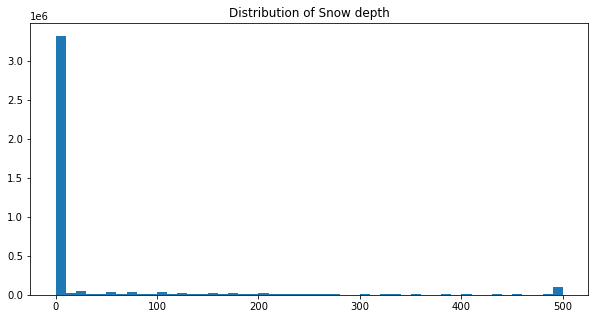

MAX = 5600, MIN = 0 AVG = 42.345150419347064


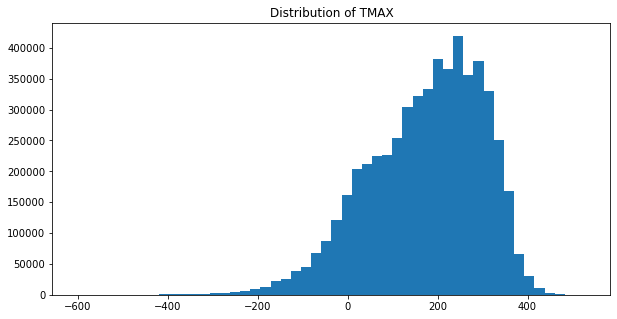

MAX = 528, MIN = -830 AVG = 173.5619295220322


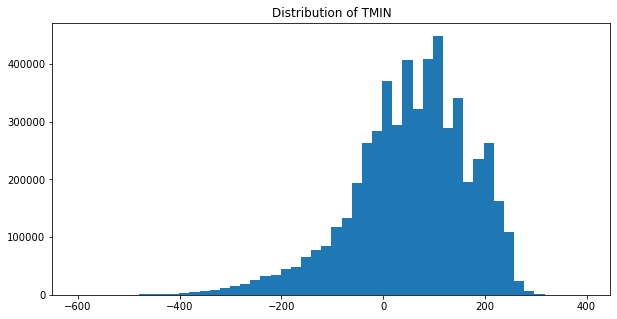

MAX = 397, MIN = -842 AVG = 54.710641799180884


In [8]:
plt.hist(np.clip(dataPRCP.value,a_min=None, a_max=500), bins = 50)
plt.title("Distribution of PRCP")
plt.show()
print(f"MAX = {max(dataPRCP.value)}, MIN = {min(dataPRCP.value)} AVG = {mean(dataPRCP.value)}")
plt.hist(np.clip(dataSnow.value,a_min=None, a_max=500), bins = 50)
plt.title("Distribution of Snow")
plt.show()
print(f"MAX = {max(dataSnow.value)}, MIN = {min(dataSnow.value)} AVG = {mean(dataSnow.value)}")
plt.hist(np.clip(dataSDepth.value,a_min=None, a_max=500), bins = 50)
plt.title("Distribution of Snow depth")
plt.show()
print(f"MAX = {max(dataSDepth.value)}, MIN = {min(dataSDepth.value)} AVG = {mean(dataSDepth.value)}")
plt.hist(np.clip(dataTmax.value,a_min=-600, a_max=600), bins = 50)
plt.title("Distribution of TMAX")
plt.plot()
plt.show()
print(f"MAX = {max(dataTmax.value)}, MIN = {min(dataTmax.value)} AVG = {mean(dataTmax.value)}")
plt.hist(np.clip(dataTmin.value,a_min=-600, a_max=600), bins = 50)
plt.title("Distribution of TMIN")
plt.show()
print(f"MAX = {max(dataTmin.value)}, MIN = {min(dataTmin.value)} AVG = {mean(dataTmin.value)}")

We can see that PRCP , snow and Snow depth looks like power law distribution, so we'll aply log transformation on them.Tmax and Tmin distributed like's 

Normalize the data

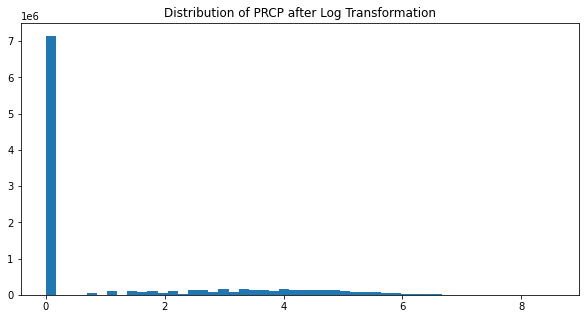

MAX = 8.536407410340042, MIN = 0.0 AVG = 1.0650698204800384


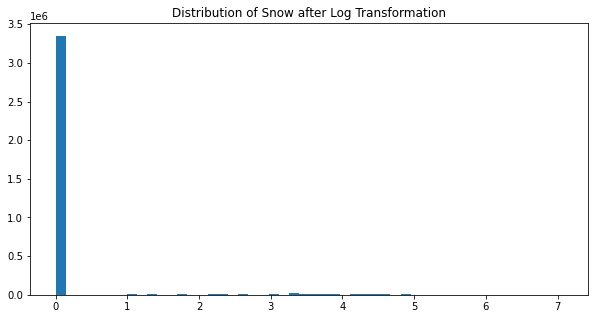

MAX = 7.074116816197362, MIN = 0.0 AVG = 0.1668124420679921


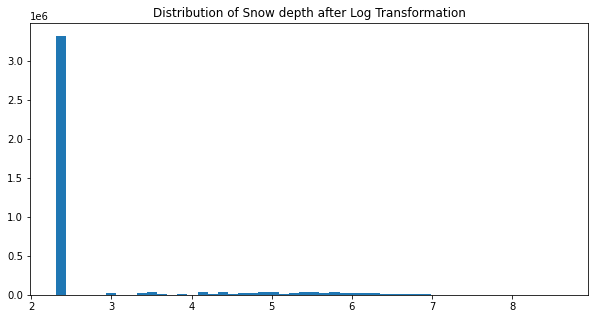

MAX = 8.632305998516742, MIN = 2.302585092994046 AVG = 2.745166780933641


In [4]:
# add lowest non-zero value because log(0) is not defined (which is one)
log_tranformed_prcp = np.log(dataPRCP.value +  sorted(data[data["Variable"] == "PRCP"].value.unique())[1])
plt.hist(log_tranformed_prcp, bins = 50)
plt.title("Distribution of PRCP after Log Transformation")
plt.show()
print(f"MAX = {max(log_tranformed_prcp)}, MIN = {min(log_tranformed_prcp)} AVG = {mean(log_tranformed_prcp)}")
log_tranformed_snow = np.log(dataSnow.value +  sorted(dataSnow.value.unique())[1])
plt.hist(log_tranformed_snow, bins = 50)
plt.title("Distribution of Snow after Log Transformation")
plt.show()
print(f"MAX = {max(log_tranformed_snow)}, MIN = {min(log_tranformed_snow)} AVG = {mean(log_tranformed_snow)}")
log_tranformed_snowd = np.log(dataSDepth.value +  sorted(dataSDepth.value.unique())[1])
plt.hist(log_tranformed_snowd, bins = 50)
plt.title("Distribution of Snow depth after Log Transformation")
plt.show()
print(f"MAX = {max(log_tranformed_snowd)}, MIN = {min(log_tranformed_snowd)} AVG = {mean(log_tranformed_snowd)}")

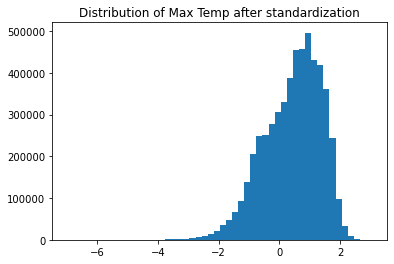

MAX = 3.051439288597002, MIN = -6.974085472835492 AVG = 0.4347768055548654


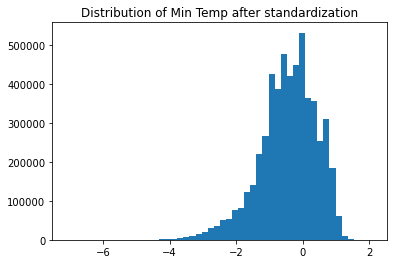

MAX = 2.0843231297253846, MIN = -7.062676266014571 AVG = -0.44265068192200024


In [316]:
standard_scaler = StandardScaler()
standardized_temp = data[(data["Variable"] == "TMAX") | (data["Variable"]=="TMIN")][["Variable", "value"]]
standardized_temp["value"] = standard_scaler.fit_transform(standardized_temp[["value"]])

standardized_maxTemp = standardized_temp[standardized_temp["Variable"] == "TMAX"]["value"]
plt.hist(standardized_maxTemp, bins = 50)
plt.title("Distribution of Max Temp after standardization")
plt.show()
print(f"MAX = {max(standardized_maxTemp)}, MIN = {min(standardized_maxTemp)} AVG = {mean(standardized_maxTemp)}")
standardized_minTemp = standardized_temp[standardized_temp["Variable"] == "TMIN"]["value"]
plt.hist(standardized_minTemp, bins = 50)
plt.title("Distribution of Min Temp after standardization")
plt.show()
print(f"MAX = {max(standardized_minTemp)}, MIN = {min(standardized_minTemp)} AVG = {mean(standardized_minTemp)}")

Now we'll look on the data in as Time Series and try to find similar pattern between station

In [15]:
dataPRCP.value = log_tranformed_prcp
# the PRCP is the max reported value in each station
#dataPRCP['Date'] = dataPRCP['Date'] - pd.to_datetime('19930101', format='%Y%m%d')
#dataPRCP['Date'] = dataPRCP['Date'].apply(lambda x: x.days)
group_prcp = dataPRCP.groupby(['StationId', 'Date']).max()

In [16]:
group_prcp.head()

value
StationId   Date                
AE000041196 1993-02-05  6.633318
            1993-02-06  0.000000
            1993-05-10  0.000000
            1993-10-15  5.598422
            1993-10-16  0.000000

We'll want to cluster only the station that has at least one sample from each day of the year (reliable) 

In [120]:
cluster_df = pd.DataFrame(columns=['stationID', 'Timeserie'])
series_matrix = []
for station, new_df in group_prcp.groupby(level=0):
    # only station with more then 100 samples are trustable
     if len(new_df) >= 100:
            new_df = new_df.reset_index(level=[0,1])
            station = new_df.reset_index()['StationId'][0]
            # group by month
            df = new_df.resample(rule='M', on='Date').mean().reset_index(level=[0])
            # if theres sample from each month
            if not np.isnan(sum(df['value'])):
                df['Date'] = df['Date'].apply(lambda x: x.month - 1)
                timeserie = np.zeros((12))
                temp = df.sort_values(by=['Date']).reset_index()[['value', 'Date']].values
                np.put(timeserie, temp.T[1].astype(int), temp.T[0])
                series_matrix.append(timeserie)
                cluster_df = pd.concat([pd.DataFrame([[station, timeserie]], columns=cluster_df.columns), cluster_df], ignore_index=True)
cluster_df.head()
series_matrix = np.stack(series_matrix,axis=0)

In [121]:
print("Number of station left :", len(cluster_df))

Number of station left : 27589


Now we'll load the location of station

In [84]:
station_df = pd.read_fwf('ghcnd-inventory.txt',colspecs='infer',header=None)
station_df.columns = ["stationID", "latitude", "longitude", "variable", "firstyear", "lastyear"]
station_df.head()

,stationID,latitude,longitude,variable,firstyear,lastyear
0,ACW00011604,17.1167,-61.7833,TMAX,1949,1949
1,ACW00011604,17.1167,-61.7833,TMIN,1949,1949
2,ACW00011604,17.1167,-61.7833,PRCP,1949,1949
3,ACW00011604,17.1167,-61.7833,SNOW,1949,1949
4,ACW00011604,17.1167,-61.7833,SNWD,1949,1949


In [122]:
station_df_for_join = station_df[["stationID", "latitude", "longitude"]].drop_duplicates(subset=["stationID"]).set_index("stationID")
cluster_df = cluster_df.join(station_df_for_join, on="stationID", how="inner").set_index('stationID')
cluster_df.head()

,Timeserie,latitude,longitude
stationID,,,
ZI000067983,"[0.0, 3.8313300423404972, 1.431882262552873, 1...",20.200,32.616
ZI000067775,"[1.7412766656547771, 2.2927845681428756, 1.546...",17.917,31.133
WZ004822290,"[1.956717374944867, 2.5579352750612316, 1.9121...",26.320,31.130
WZ004467410,"[0.5465797452428788, 1.341651579723965, 0.4239...",26.850,31.920
WZ004455110,"[1.4862186319414346, 1.4564138450575221, 1.162...",26.533,31.300


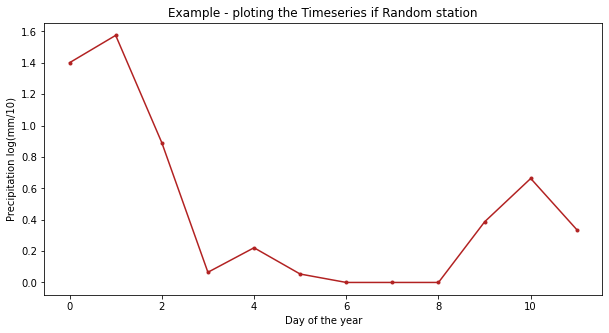

In [174]:
plt.plot(cluster_df[cluster_df.index == 'IS000002011']['Timeserie'].values[0], marker='.', color='firebrick')
plt.xlabel('Day of the year')
plt.ylabel('Precipitation log(mm/10)')
plt.title("Example - ploting the Timeseries if Random station")
plt.show()

In [ ]:
#normalize each timeseries by its mean to get better classification
centroid = pd.DataFrame(columns=['num of cluster']) 
X_train = TimeSeriesScalerMeanVariance().fit_transform(series_matrix).reshape(27589, 12)
for k in range(12,20):
    dba_km = TimeSeriesKMeans(n_clusters=k,
                          n_init=3,
                          random_state=0)
    cluster_df[str(k) + "_clusters"] = dba_km.fit_predict(X_train)
    print("silhouette_score ", str(k) ,"_clusters: ", metrics.silhouette_score(X_train, cluster_df[str(k) + "_clusters"], metric='euclidean'))
cluster_df.to_csv("cluster_df.csv")

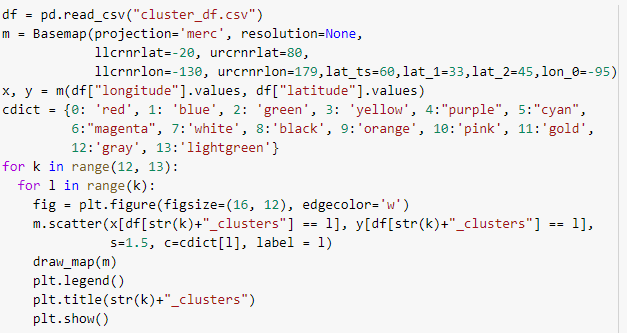

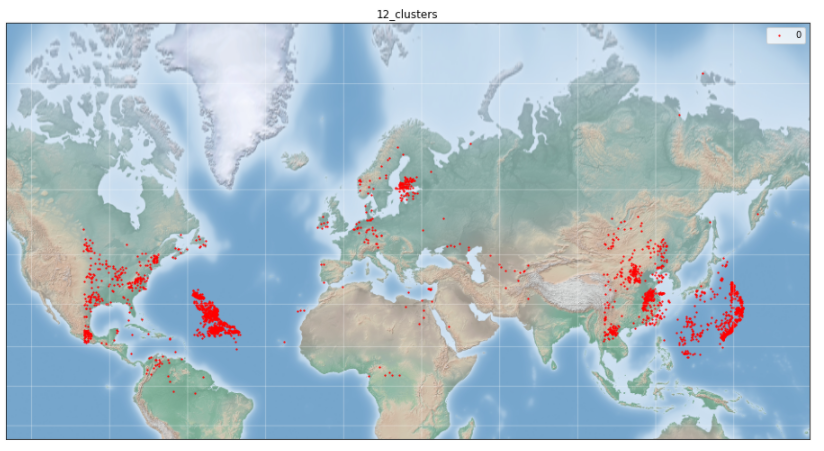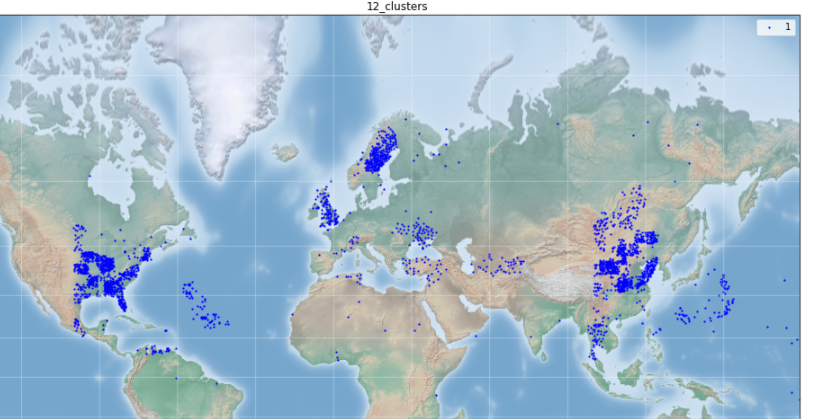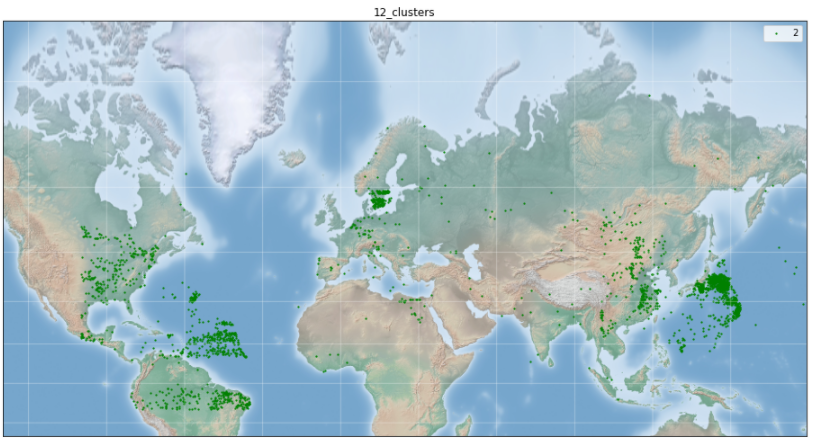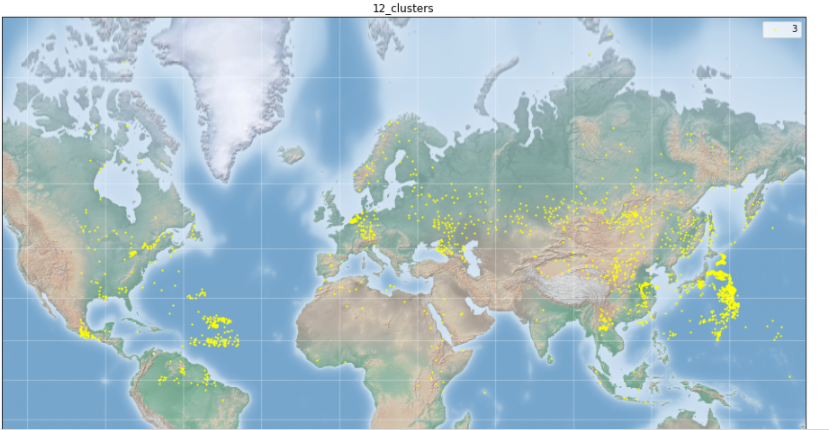
...
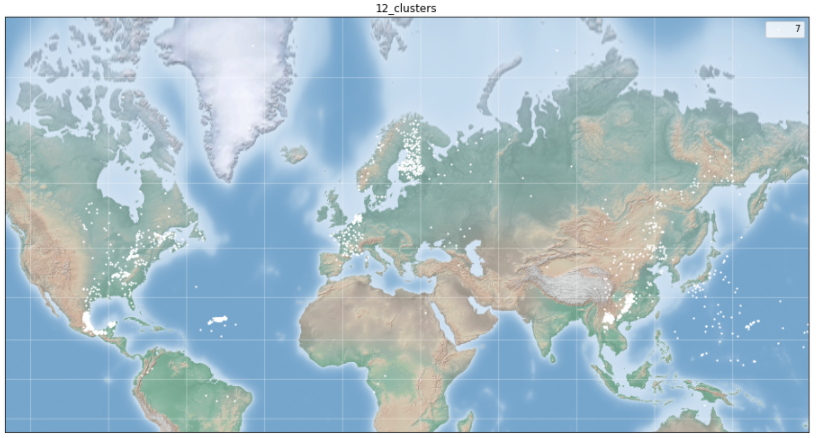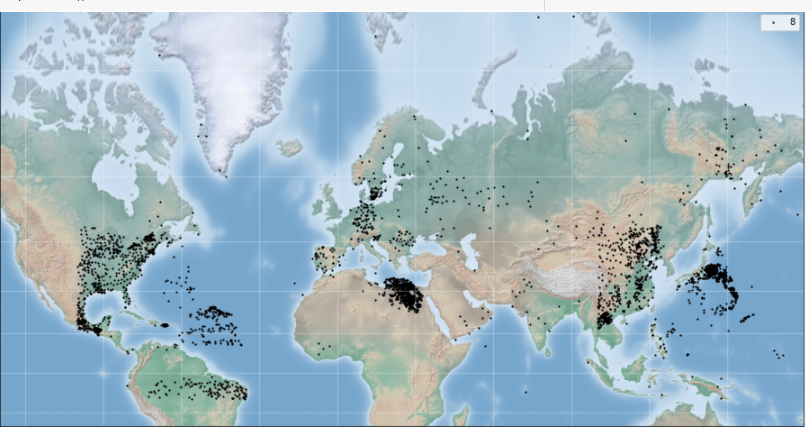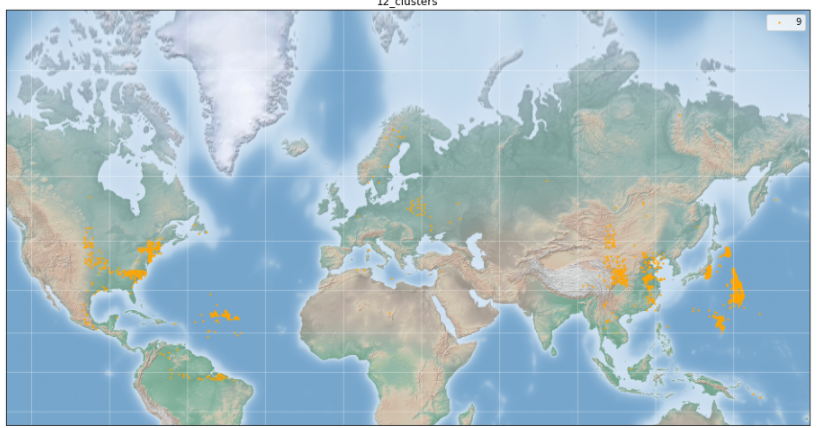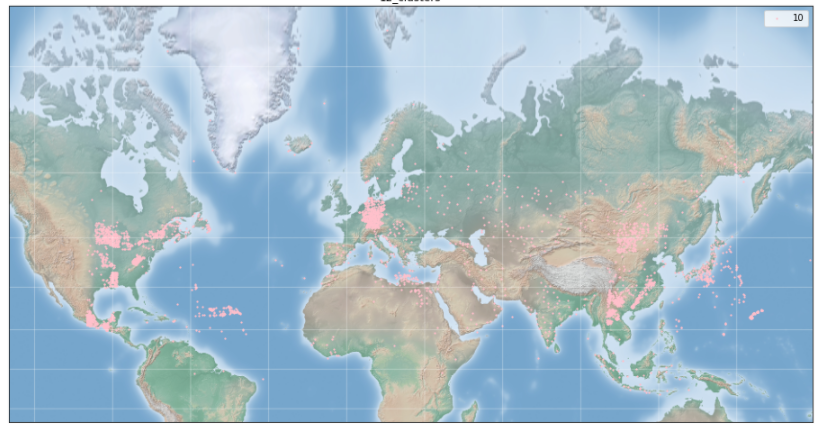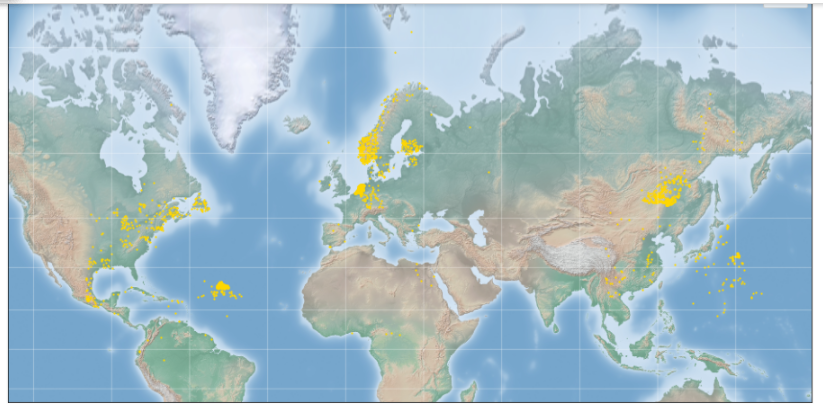

With this classification we can get some kind of idea of the partitioning we want to aplly in the DB, thought theres some clusters that seems suspicious (like cluster 8) that we cannot infer if Kmeans did not cluster them correctly or the Precipitation in 1993 was similar at those stations

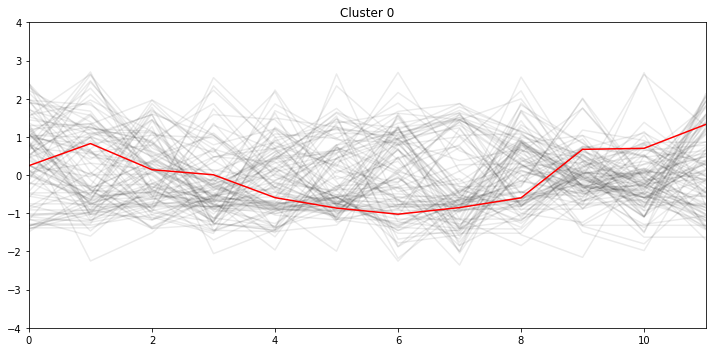

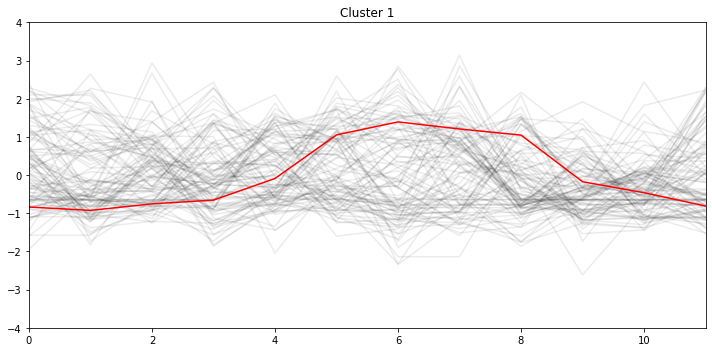

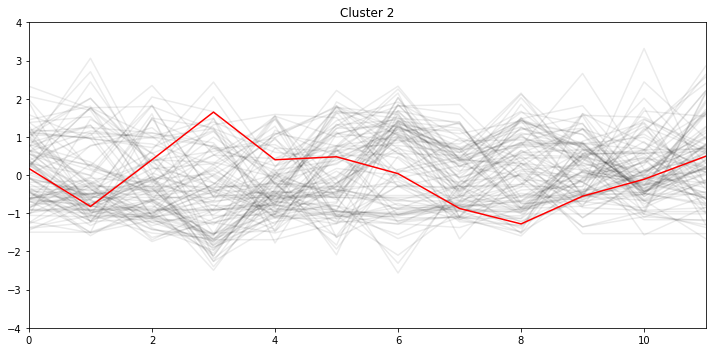

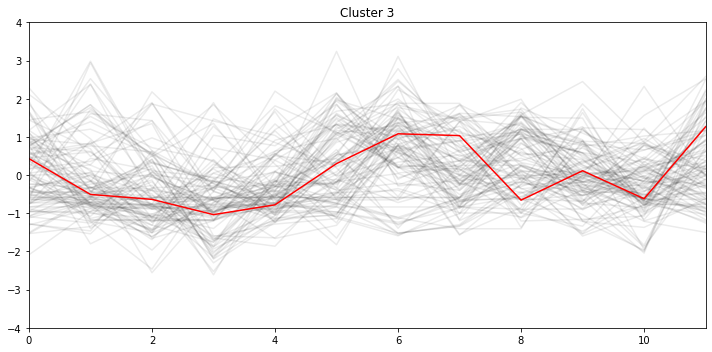

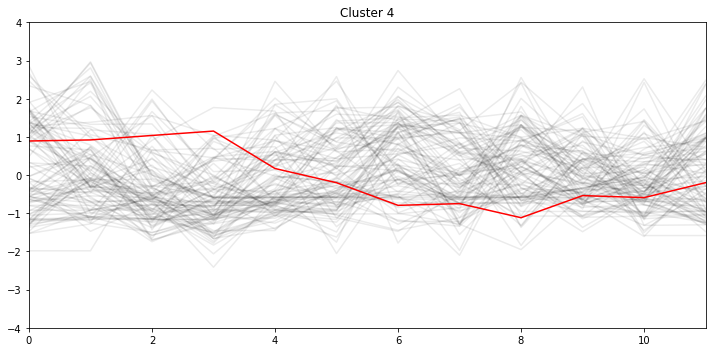

...

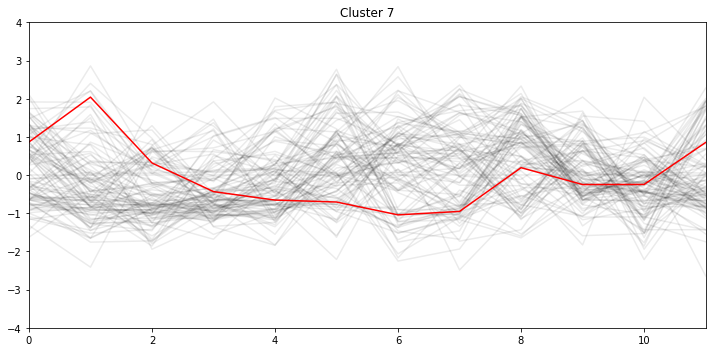

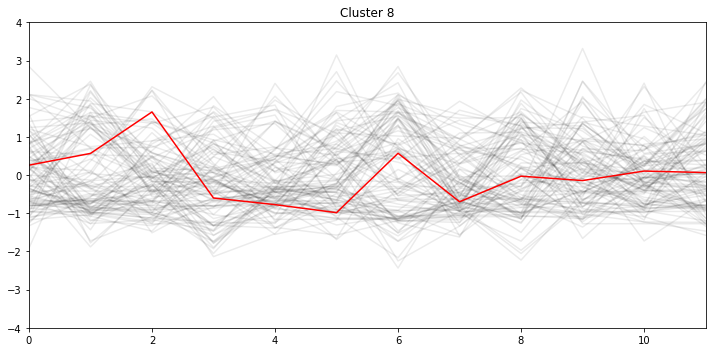

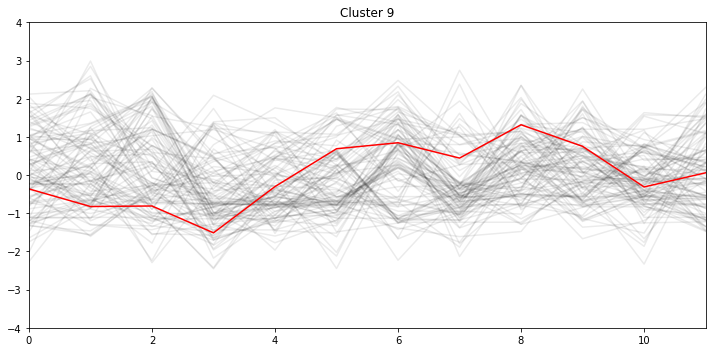

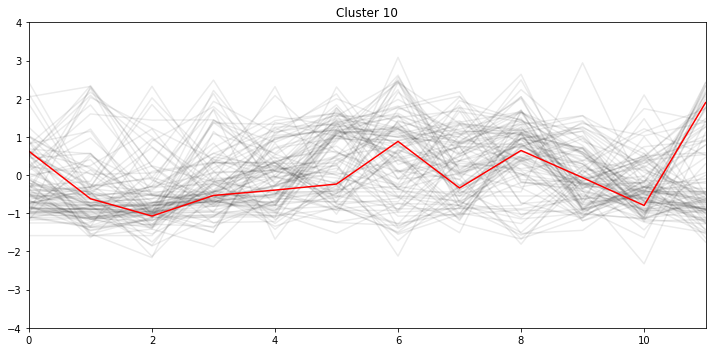

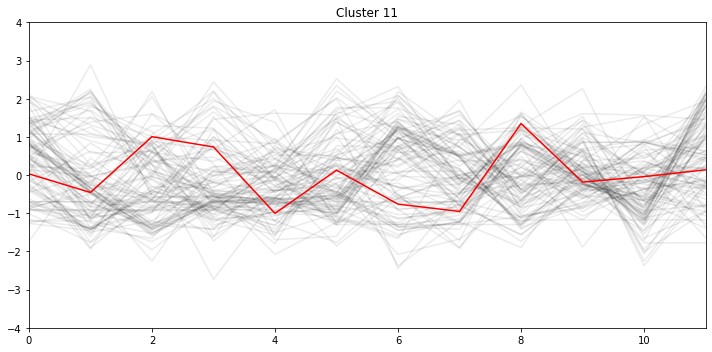

In [175]:
for yi in range(12):
    t = np.stack(cluster_df[cluster_df['12_clusters'] == yi]['Timeserie'].sample(100).to_numpy(),axis=0)
    for xx in TimeSeriesScalerMeanVariance().fit_transform(t):
        plt.plot(xx.ravel(), "k-", alpha=.08)
    plt.xlim(0, 11)
    plt.ylim(-4, 4)
    plt.title("Cluster %d" % (yi))
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.tight_layout()
    plt.show()

The red line is the centroid(barycenter) of each cluster and the black lines are 100 random samples from the cluster.
We can get some kind of a felling of the behavor of precipitation at each cluster , but we need to remmber those values are normalized.

In [58]:
scaler = TimeSeriesScalerMinMax(value_range=(0., 1.))
scaler.fit_transform(np.stack(series_matrix,axis=0)).reshape((16596, 365)).shape

(16596, 365)

In [ ]:
cluster_df.to_csv("out.csv").reshape((28232, 12))

In [81]:
np.stack(series_matrix,axis=0).shape

(28232, 12)

In [104]:
series_matrix.max()

nan